### Описание проекта
Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.
Для начала они просят вас — аналитика — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.
Постарайтесь сделать презентацию информативной и лаконичной. Её структура и оформление сильно влияют на восприятие информации читателями вашего исследования. Выбирать инструменты (matplotlib, seaborn и другие) и типы визуализаций вы можете самостоятельно.
Вам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

### Описание данных
Файл moscow_places.csv:

    name — название заведения;
    address — адрес заведения;
    category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
    hours — информация о днях и часах работы;
    lat — широта географической точки, в которой находится заведение;
    lng — долгота географической точки, в которой находится заведение;
    rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
    price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
    avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
«Средний счёт: 1000–1500 ₽»;
«Цена чашки капучино: 130–220 ₽»;
«Цена бокала пива: 400–600 ₽».
и так далее;

    middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.

    middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
0 — заведение не является сетевым
1 — заведение является сетевым

    district — административный район, в котором находится заведение, например Центральный административный округ;
    seats — количество посадочных мест.

### Шаг 1. Загрузите данные и изучите общую информацию

<li> Изучите общую информацию о датасете. Сколько заведений представлено? Что можно сказать о каждом столбце? Значения какого типа они хранят?

In [1]:
# Загружаю библиотеки

import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats as st
import math
import json
import plotly.express as px
from folium import Map, Choropleth
from folium.plugins import MarkerCluster
from folium import Marker

In [2]:
try:
    df = pd.read_csv(r'./datasets/moscow_places.csv', delimiter=',')
except:
    df = pd.read_csv('/datasets/moscow_places.csv', delimiter=',')

In [3]:
display(df.info())
display(df.head())
display(df['name'].count())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


None

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


8406

Заведений представлено 8406. Датабаза хранит в себе обширные данные о каждом заведении, осталось только узнать сколько сотрудников работают и телефон каждого заведения) Очень подробная база

Проблем неправильного типа в столбцах не увидел

### Шаг 2. Выполните предобработку данных

In [4]:
display(df.duplicated(subset=['name', 'address']).sum())

0

Дубликатов нет

In [5]:
display(df.isna().sum())
pd.DataFrame(round(df.isna().mean()*100,1))

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

,0
name,0.0
category,0.0
address,0.0
district,0.0
hours,6.4
lat,0.0
lng,0.0
rating,0.0
price,60.6
avg_bill,54.6


Пропуски встречаются. В тех полях, где пропусков более 20% нельзя заполнить медианным значением, либо же поставить заглушки, поскольку это сильно повлияет на данные в целом.
Касательно столбца hours, если найду популярный вариант, чем можно будет заполнить пропуски без потери большого урона по итоговым значениям, заполню ими

In [6]:
# Создайте столбец street с названиями улиц из столбца с адресом.
def street_check(row):
    address = row['address'].split(', ')
    street = address[1]
    return street
df['street_name'] = df.apply(street_check, axis=1)

In [7]:
# Создайте столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7)
def everyday_check(row):
    if row['hours'] == 'ежедневно, круглосуточно':
        return True
    else:
        return False
df['24_7'] = df.apply(everyday_check, axis=1)

### Шаг 3. Анализ данных

<li> Какие категории заведений представлены в данных? Необходимо исследовать количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. 

In [8]:
type_cat = df.groupby('category', as_index=False)['name'].count().sort_values(by='name', ascending=False)
type_cat.head(10)

,category,name
3,кафе,2378
6,ресторан,2043
4,кофейня,1413
0,"бар,паб",765
5,пиццерия,633
2,быстрое питание,603
7,столовая,315
1,булочная,256


In [9]:
# Поменял, чтобы глаза не мозолило
df['category'] = df['category'].replace('бар,паб', 'бар')
df['category'] = df['category'].replace('быстрое питание', 'фастфуд')

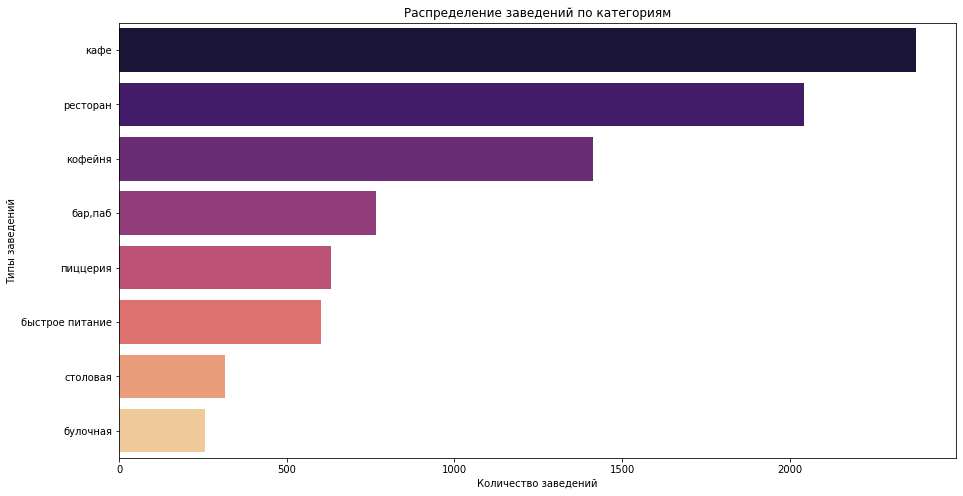

In [10]:
plt.figure(figsize=(15, 8))
sns.barplot(x='name', y='category', data=type_cat, palette='magma')
plt.title('Распределение заведений по категориям')
plt.xlabel('Количество заведений')
plt.ylabel('Типы заведений')
plt.show()

Больше всего объектов: Кафе и ресторан, как и ожидалось, т.к. они наиболее распространены

<li> Исследуйте количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. 

In [11]:
seats_by_category = df.groupby('category', as_index=False)['seats'].median().sort_values(by='seats', ascending=False)
seats_by_category

,category,seats
5,ресторан,86.0
0,бар,82.5
3,кофейня,80.0
6,столовая,75.5
7,фастфуд,65.0
2,кафе,60.0
4,пиццерия,55.0
1,булочная,50.0


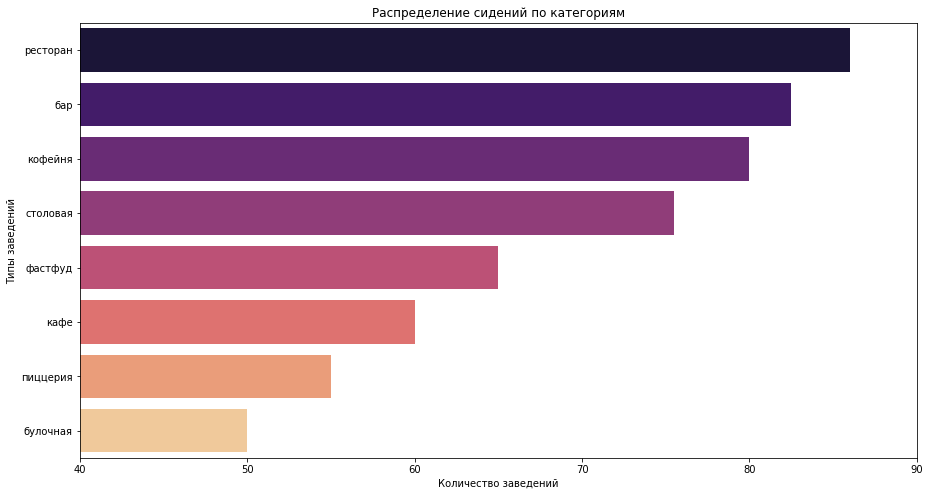

In [12]:
plt.figure(figsize=(15, 8))
sns.barplot(x='seats', y='category', data=seats_by_category, palette='magma')
plt.title('Распределение сидений по категориям')
plt.xlabel('Количество заведений')
plt.ylabel('Типы заведений')
plt.xlim([40,90])
plt.show()

Лидируют такие категории, как: ресторан, бар, кофейня. Кафе же, несмотря на большой обьем, не нуждается в таком большом количестве сидений

<li> Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете.

In [13]:
net_group = df.groupby('chain', as_index=False)['name'].count().sort_values(by='name', ascending=False)
net_group

,chain,name
0,0,5201
1,1,3205


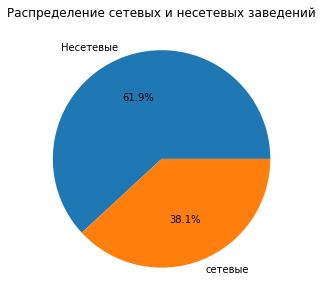

In [14]:
plt.figure(figsize = (5, 5))
plt.pie(net_group.name, labels=['Несетевые','сетевые'], autopct='%1.1f%%')
plt.title('Распределение сетевых и несетевых заведений')
plt.show()

Несетевых заведений больше. Их количество составляет около 60% от общего количества

<li>     Какие категории заведений чаще являются сетевыми? 

In [15]:
net_type = df.pivot_table(index = 'category', values='name', columns = 'chain', aggfunc='count').reset_index()
net_type['total'] = net_type[0] + net_type[1]
net_type['rate'] = net_type[1] / net_type['total']
net_type = net_type.sort_values(by='rate', ascending=False)
display(net_type)

chain,category,0,1,total,rate
1,булочная,99,157,256,0.613281
4,пиццерия,303,330,633,0.521327
3,кофейня,693,720,1413,0.509554
7,фастфуд,371,232,603,0.384743
5,ресторан,1313,730,2043,0.357318
2,кафе,1599,779,2378,0.327586
6,столовая,227,88,315,0.279365
0,бар,596,169,765,0.220915


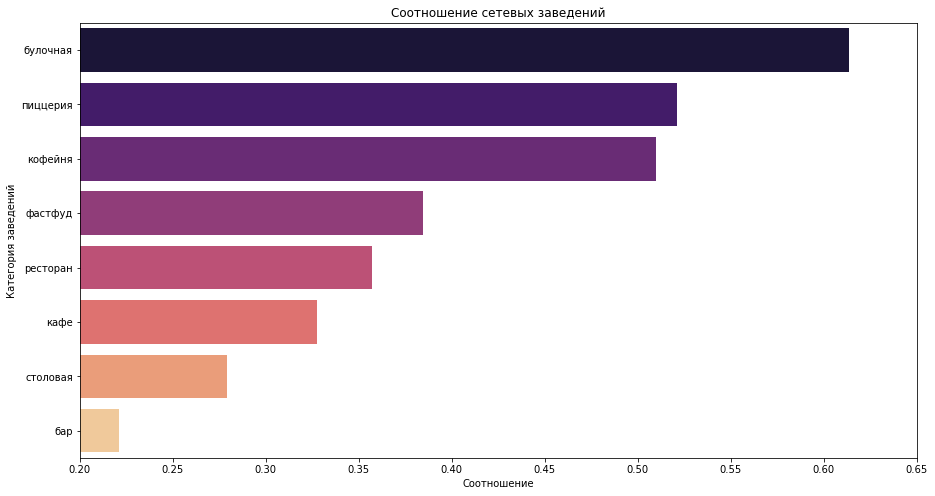

In [16]:
plt.figure(figsize=(15, 8))
sns.barplot(x='rate', y='category', data=net_type, palette='magma')
plt.title('Соотношение сетевых заведений')
plt.xlabel('Соотношение')
plt.ylabel('Категория заведений')
plt.xlim([0.2,0.65])
plt.show()

<li> Необходимо сгрупировать данные по названиям заведений и найдите топ-15 популярных сетей в Москве.

In [17]:
pop_size = df.query('chain == 1').groupby('name', as_index=False)['chain'].count().sort_values('chain', ascending=False)
display(pop_size.head(15))
pop_size_list = pop_size['name'][:15].tolist()
top_cat = df.query('(name in @pop_size_list)').groupby('category')['name'].count()
top_cat

,name,chain
746,Шоколадница,120
344,Домино'с Пицца,76
340,Додо Пицца,74
148,One Price Coffee,71
759,Яндекс Лавка,69
59,Cofix,65
170,Prime,50
679,Хинкальная,44
378,КОФЕПОРТ,42
431,Кулинарная лавка братьев Караваевых,39


category
бар           4
булочная     25
кафе        100
кофейня     336
пиццерия    151
ресторан    186
столовая      2
фастфуд      12
Name: name, dtype: int64

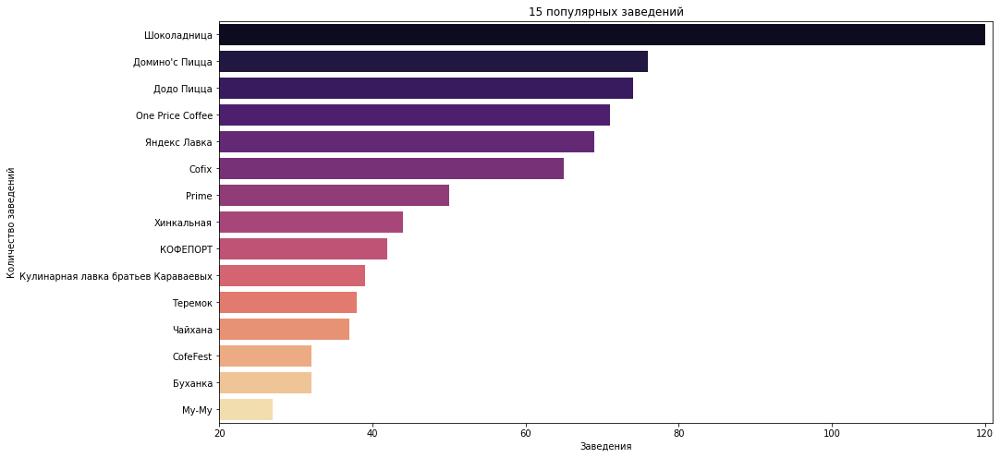

In [18]:
plt.figure(figsize=(15, 8))
sns.barplot(x='chain', y='name', data=pop_size.head(15), palette='magma')
plt.title('15 популярных заведений')
plt.xlabel('Заведения')
plt.ylabel('Количество заведений')
plt.xlim([20,121])
plt.show()

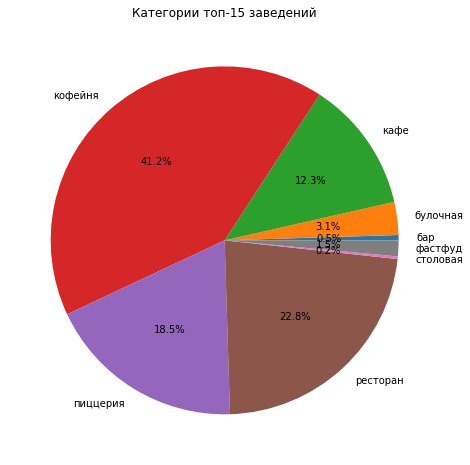

In [19]:
plt.figure(figsize=(8, 8))
plt.pie(top_cat, labels=top_cat.index, autopct='%1.1f%%')
plt.title('Категории топ-15 заведений')
plt.show()

Большей популярностью обладают кофейни, рестораны, пиццерии и кафе. 

<li> Какие административные районы Москвы присутствуют в датасете? Отобразите общее количество заведений и количество заведений каждой категории по районам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [20]:
district_data = df.groupby(['district','category'], as_index=False)['name'].count()
display(district_data)

,district,category,name
0,Восточный административный округ,бар,53
1,Восточный административный округ,булочная,25
2,Восточный административный округ,кафе,272
3,Восточный административный округ,кофейня,105
4,Восточный административный округ,пиццерия,72
...,...,...,...
67,Южный административный округ,кофейня,131
68,Южный административный округ,пиццерия,73
69,Южный административный округ,ресторан,202
70,Южный административный округ,столовая,44


In [21]:
fig = px.bar(district_data, x='district', y='name', color='category', title='Расположеность заведений по районам')
fig.update_xaxes(categoryorder="total descending")
fig.show()

<li>  Визуализирую распределение средних рейтингов по категориям заведений.

In [22]:
average_ratings = df.groupby('category', as_index=False)['rating'].mean().sort_values('rating', ascending=False)
average_ratings

,category,rating
0,бар,4.387712
4,пиццерия,4.301264
5,ресторан,4.290357
3,кофейня,4.277282
1,булочная,4.268359
6,столовая,4.211429
2,кафе,4.123886
7,фастфуд,4.050249


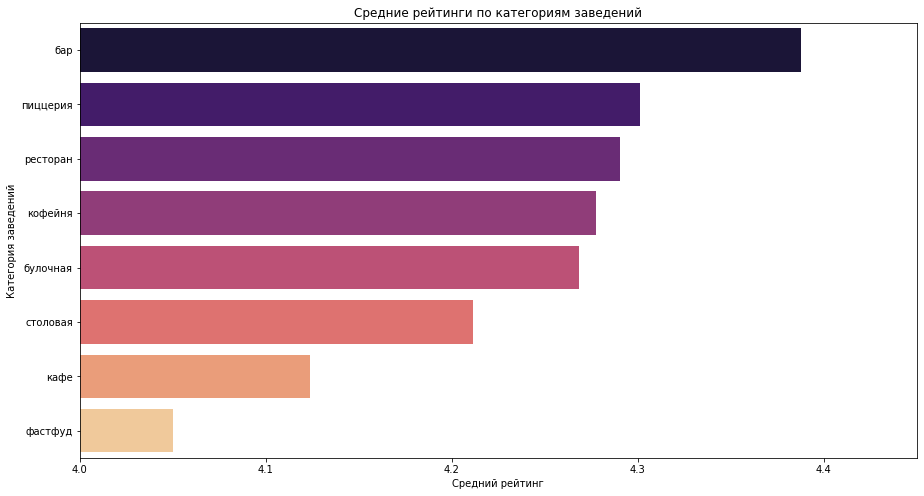

In [23]:
plt.figure(figsize=(15, 8))
sns.barplot(x='rating', y='category', data=average_ratings, palette='magma')
plt.title('Средние рейтинги по категориям заведений')
plt.xlabel('Средний рейтинг')
plt.ylabel('Категория заведений')
plt.xlim([4,4.45])
plt.show()

<li>   Строю фоновую картограмму (хороплет) со средним рейтингом заведений каждого района

In [24]:
dist_rate = df.groupby('district', as_index=False)['rating'].mean().sort_values('rating', ascending=False)
dist_rate

,district,rating
5,Центральный административный округ,4.377520
2,Северный административный округ,4.239778
4,Северо-Западный административный округ,4.208802
8,Южный административный округ,4.184417
1,Западный административный округ,4.181551
0,Восточный административный округ,4.174185
7,Юго-Западный административный округ,4.172920
3,Северо-Восточный административный округ,4.148260
6,Юго-Восточный административный округ,4.101120


In [25]:
# загружаем JSON-файл с границами округов Москвы
try:
    state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
except:
    state_geo = './datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=dist_rate,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

<li>     Отображаю все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [26]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

<li>     Вывожу топ-15 улиц по количеству заведений. 

In [27]:
street_top = df.groupby(['street_name'], as_index=False)['name'].count().sort_values('name', ascending=False)
display(street_top.head(15))
street_list = street_top['street_name'][:15].tolist()
top_street = df.query('(street_name in @street_list)').groupby(['street_name', 'category'], as_index=False)\
        ['name'].count()
top_street

,street_name,name
1090,проспект Мира,184
773,Профсоюзная улица,122
1087,проспект Вернадского,108
525,Ленинский проспект,107
523,Ленинградский проспект,95
373,Дмитровское шоссе,88
455,Каширское шоссе,77
298,Варшавское шоссе,76
524,Ленинградское шоссе,70
550,МКАД,65


,street_name,category,name
0,Варшавское шоссе,бар,6
1,Варшавское шоссе,кафе,18
2,Варшавское шоссе,кофейня,14
3,Варшавское шоссе,пиццерия,4
4,Варшавское шоссе,ресторан,20
...,...,...,...
106,улица Миклухо-Маклая,кафе,21
107,улица Миклухо-Маклая,кофейня,4
108,улица Миклухо-Маклая,пиццерия,2
109,улица Миклухо-Маклая,ресторан,15


In [28]:
fig = px.bar(top_street, x='street_name', y='name', color='category', title='15 популярных улиц')
fig.update_xaxes(categoryorder="total descending")
fig.show()

<li>     Вывожу улицы, на которых находится только один объект общепита

In [29]:
street_top_one = street_top[street_top['name'] == 1]
street_list_one = street_top_one['street_name'].to_list()
street_one_cat = df.query('(street_name in @street_list_one)').groupby('category')['name'].count()

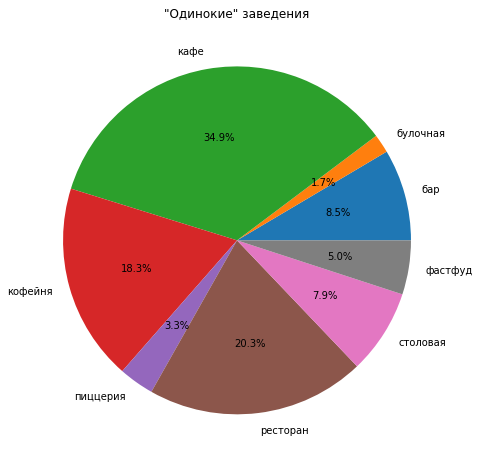

In [30]:
plt.figure(figsize=(8, 8))
plt.pie(street_one_cat, labels=street_one_cat.index, autopct='%1.1f%%')
plt.title('"Одинокие" заведения')
plt.show()

Больше всего "одиночных" заведений, по категории - кафе. Следом идут ресторан и кофейни

<li> Посчитайте медиану ср. чека для каждого района. Используйте это значение в качестве ценового индикатора района.

In [31]:
median_district = df.groupby('district', as_index=False)['middle_avg_bill'].median()
median_district

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [32]:
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=median_district,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медиана среднего чека',
).add_to(m)

# выводим карту
m

Я считаю, что удаленность не влияет, а влияет то, какой это округ. В центральном районе конечно высокая медиана ср. чека, но в западном округе, медиана точно такая же. Если же западный округ возьмем как выброс, то действительно отдаленость от центра влияет на медиану среднего чека чуть ли не в два раза

### Шаг 4. Детализируем исследование: открытие кофейни

<li>  Сколько всего кофеен в датасете?

In [33]:
cofi = df.query('category == "кофейня"')
display(cofi['name'].count())

1413

<li> В каких районах их больше всего, каковы особенности их расположения?

In [34]:
dist_cofi = cofi.groupby('district', as_index=False)['name'].count().sort_values('name', ascending=False)
dist_cofi

,district,name
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


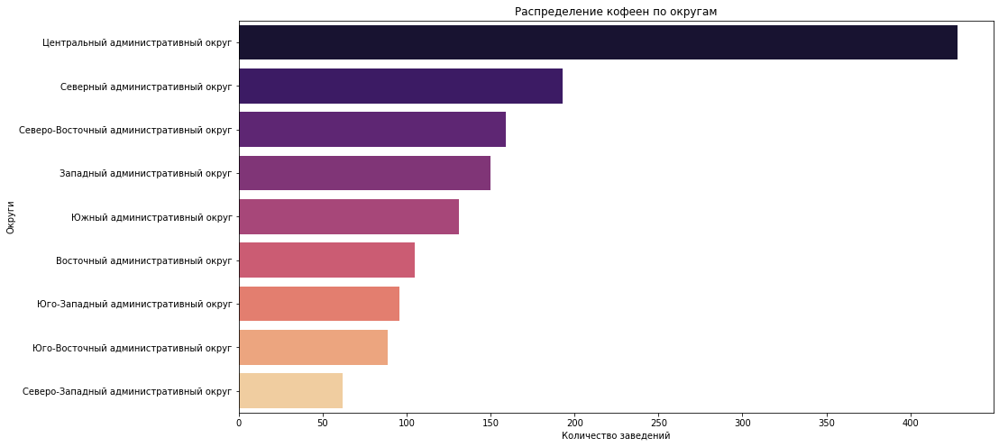

In [35]:
plt.figure(figsize=(15, 8))
sns.barplot(x='name', y='district', data=dist_cofi, palette='magma')
plt.title('Распределение кофеен по округам')
plt.xlabel('Количество заведений')
plt.ylabel('Округи')
plt.show()

Подавляющее большинство кофеен находятся в центральном округе, после идут северный и северно-восточный округ.

<li> Есть ли круглосуточные кофейни?

In [36]:
alltime_cofi = cofi.groupby('24_7', as_index=False)['name'].count().sort_values('name', ascending=False)
alltime_cofi

,24_7,name
0,False,1354
1,True,59


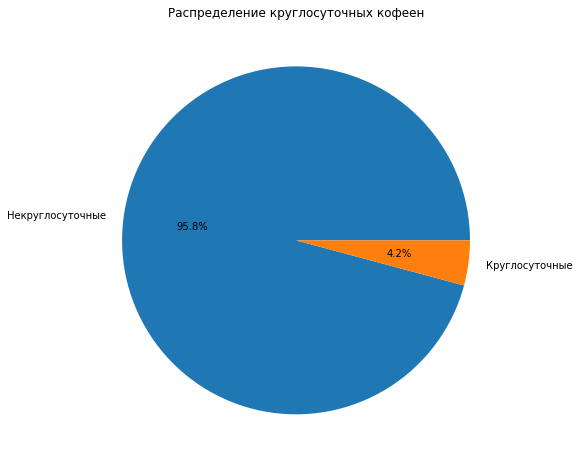

In [37]:
plt.figure(figsize=(8, 8))
plt.pie(alltime_cofi.name, labels=['Некруглосуточные', 'Круглосуточные'], autopct='%1.1f%%')
plt.title('Распределение круглосуточных кофеен')
plt.show()

Круглосуточных кофеен около 5%

<li> Какие у кофеен рейтинги? Как они распределяются по районам?

In [38]:
rating_cofi = cofi.groupby('district', as_index=False)['rating'].mean().sort_values('rating', ascending=False)
rating_cofi

,district,rating
5,Центральный административный округ,4.336449
4,Северо-Западный административный округ,4.325806
2,Северный административный округ,4.291710
7,Юго-Западный административный округ,4.283333
0,Восточный административный округ,4.282857
8,Южный административный округ,4.232824
6,Юго-Восточный административный округ,4.225843
3,Северо-Восточный административный округ,4.216981
1,Западный административный округ,4.195333


In [39]:
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_cofi,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

В целом, рейтинги мало отличимы. Топ по рейтингу такой же, как и по количеству заведений

<li> На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [40]:
mean_cofi = cofi.groupby('district', as_index=False)['middle_coffee_cup'].mean().sort_values('middle_coffee_cup', ascending=False)
mean_cofi

,district,middle_coffee_cup
1,Западный административный округ,189.938776
5,Центральный административный округ,187.518519
7,Юго-Западный административный округ,184.176471
0,Восточный административный округ,174.023810
2,Северный административный округ,165.789474
4,Северо-Западный административный округ,165.523810
3,Северо-Восточный административный округ,165.333333
8,Южный административный округ,158.488372
6,Юго-Восточный административный округ,151.088235


In [41]:
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=mean_cofi,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средняя стоимость чашки кофе',
).add_to(m)

# выводим карту
m

Я бы сказал, что не более 190, но и не менее 165 рублей. Зависит от того, в каком районе будет открытие, чтобы конкурировать с кофейнями соперников по цене/качество

<h3> Рекомендации

Я более чем уверен, что я даю рекомендации увереным в себе людям, которые хотят открыть топовую кофейню и поэтому я рекомендую открывать её в центральном округе. В этом округе уже имеются много кофеен, что задает моду и из-за большого спроса, заведение будет иметь уже хорошую тендецию на начальную проходимость, чтобы раскрутить кофейню. <br>
Если в центре, ну никак не получится из-за высокой арендной платы или банальным отсутсвия места, где можно было бы открыть, то я бы порекомендовал расмотреть западное направление, также, как и северо-западное, так и южно-западное. Они менее популярны и менее востребованы, но также являются неплохой альтернативой для окупаемости, если мы расматриваем такой фактор, как среднюю стоимость капучино. <br>
Из того, что я бы хотел добавить, то в среднем, у всех кофеен одинаковый рейтинг - 4.2. В начале, лучше набрать этот базовый рейтинг, чтобы в дальнейшем быть конкурентоспособным. Расматривал круглосуточные кофейни, но не уверен, что это хороший вариант, поскольку мало кому нужно кофе в 3 часа утра)

###     Шаг 5. Подготовка презентации

https://drive.google.com/file/d/1fKW2Tcysurq_PXVP-8v0gH1cMMxjfFdi/view